# Data preprocessing for transformer model
1. Leggere il dataset da file CSV
2. Filtering sulle colonne
8. Eventuali grafici di diagnostica
6. Trovare gli eventi di pioggia maggiori di una soglia (0.1 mm/h)


3. Gestire i valori mancanti
4. Normalization (standard scaler)
5. wind sin e cosine transformation
9. Restituisce il dataframe preprocessato e lo scaler utilizzato

In [66]:
import os
import glob
import pandas as pd
import torch
from torch.utils.data import Dataset
from sklearn.preprocessing import StandardScaler
import numpy as np

In [67]:
station_id = 1
base_path=f"../../../data/storage/vantage-pro-ws{station_id}/2025"
month_folders = sorted(glob.glob(os.path.join(base_path, "*")))
all_dfs = []
for month_folder in month_folders:
    csv_files = sorted(glob.glob(os.path.join(month_folder, "*.csv")))
    if not csv_files: continue
    for csv_file in csv_files:
        all_dfs.append(pd.read_csv(csv_file))
if not all_dfs:
    raise ValueError("Nessun CSV trovato!")
df = pd.concat(all_dfs, ignore_index=True)
df['Datetime'] = pd.to_datetime(df['Datetime'])
if station_id is not None:
    df["station_id"] = station_id
    
df = df.sort_values('Datetime').reset_index(drop=True)
df

,Datetime,BarTrend,Barometer,TempIn,HumIn,TempOut,WindSpeed,WindSpeed10Min,WindDir,HumOut,...,aqi_1_hour_val,pm_10_nowcast,aqi_1_hour_desc,pm_10_1_hour,dew_point,pm_10,pct_pm_data_1_hour,ts,pm_2p5,station_id
0,2025-01-17 12:21:48+00:00,196,30.259,64.6,44.0,54.4,18.0,13.0,19.0,62.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
1,2025-01-17 12:21:58+00:00,196,30.259,64.6,44.0,54.4,12.0,13.0,36.0,62.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
2,2025-01-17 12:22:09+00:00,196,30.256,64.6,44.0,54.4,10.0,13.0,71.0,62.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
3,2025-01-17 12:22:19+00:00,196,30.256,64.6,44.0,54.4,9.0,13.0,350.0,62.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
4,2025-01-17 12:22:30+00:00,196,30.256,64.6,44.0,54.4,4.0,13.0,360.0,62.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2674189,2025-12-16 22:43:30+00:00,20,30.023,70.8,48.0,62.1,8.0,3,218.0,81.0,...,8.081794,14.900352,NaN,14.075477,56.9,8.057143,NaN,NaN,5.057143,1
2674190,2025-12-16 22:43:40+00:00,20,30.022,70.8,48.0,62.1,3.0,3,117.0,81.0,...,8.081794,14.900352,NaN,14.075477,56.9,8.057143,NaN,NaN,5.057143,1
2674191,2025-12-16 22:43:51+00:00,20,30.022,70.8,48.0,62.1,3.0,3,122.0,81.0,...,8.081794,14.900352,NaN,14.075477,56.9,8.057143,NaN,NaN,5.057143,1
2674192,2025-12-16 22:44:02+00:00,20,30.022,70.8,48.0,62.1,3.0,3,199.0,81.0,...,8.081794,14.900352,NaN,14.075477,56.9,8.057143,NaN,NaN,5.057143,1


In [68]:
station_ids = [1, 3, 4, 5]  # le stazioni di interesse
datasets = {}  # qui salviamo i DataFrame per ogni stazione

for station_id in station_ids:
    base_path = f"../../../data/storage/vantage-pro-ws{station_id}/2025"
    month_folders = sorted(glob.glob(os.path.join(base_path, "*")))
    
    all_dfs = []
    for month_folder in month_folders:
        csv_files = sorted(glob.glob(os.path.join(month_folder, "*.csv")))
        for csv_file in csv_files:
            all_dfs.append(pd.read_csv(csv_file))
    
    if not all_dfs:
        print(f"Nessun CSV trovato per la stazione {station_id}, salto...")
        continue
    
    df = pd.concat(all_dfs, ignore_index=True)
    df['Datetime'] = pd.to_datetime(df['Datetime'])
    df['station_id'] = station_id
    df = df.sort_values('Datetime').reset_index(drop=True)
    
    datasets[station_id] = df  # salviamo il DataFrame nel dizionario
# datasets[3], datasets[4], datasets[5]

In [69]:
datasets[1], datasets[3], datasets[4], datasets[5]

(                         Datetime BarTrend  Barometer  TempIn  HumIn  TempOut  \
 0       2025-01-17 12:21:48+00:00      196     30.259    64.6   44.0     54.4   
 1       2025-01-17 12:21:58+00:00      196     30.259    64.6   44.0     54.4   
 2       2025-01-17 12:22:09+00:00      196     30.256    64.6   44.0     54.4   
 3       2025-01-17 12:22:19+00:00      196     30.256    64.6   44.0     54.4   
 4       2025-01-17 12:22:30+00:00      196     30.256    64.6   44.0     54.4   
 ...                           ...      ...        ...     ...    ...      ...   
 2674189 2025-12-16 22:43:30+00:00       20     30.023    70.8   48.0     62.1   
 2674190 2025-12-16 22:43:40+00:00       20     30.022    70.8   48.0     62.1   
 2674191 2025-12-16 22:43:51+00:00       20     30.022    70.8   48.0     62.1   
 2674192 2025-12-16 22:44:02+00:00       20     30.022    70.8   48.0     62.1   
 2674193                       NaT        0     29.653    82.4   55.0     80.5   
 
          Wind

# Gestiremo i NaN dopo aver catturato gli eventi

In [70]:
# Colonne da tenere
feature_cols = [
    "Barometer",
    "TempIn",
    "HumIn",
    "TempOut",
    "WindSpeed",
    "HumOut",
    "WindDir_sin",
    "WindDir_cos"
]
target_cols = ["RainRate"]

cols_to_keep = feature_cols + target_cols + ["Datetime", "station_id"]  # includiamo anche Datetime e station_id

# Applichiamo il filtering a tutti i dataset
for station_id, df in datasets.items():
    # Tenere solo le colonne desiderate (intersezione per sicurezza se qualche colonna manca)
    datasets[station_id] = df[[c for c in cols_to_keep if c in df.columns]].copy()

In [71]:
datasets[1], datasets[3], datasets[4], datasets[5]

(         Barometer  TempIn  HumIn  TempOut  WindSpeed  HumOut  RainRate  \
 0           30.259    64.6   44.0     54.4       18.0    62.0       0.0   
 1           30.259    64.6   44.0     54.4       12.0    62.0       0.0   
 2           30.256    64.6   44.0     54.4       10.0    62.0       0.0   
 3           30.256    64.6   44.0     54.4        9.0    62.0       0.0   
 4           30.256    64.6   44.0     54.4        4.0    62.0       0.0   
 ...            ...     ...    ...      ...        ...     ...       ...   
 2674189     30.023    70.8   48.0     62.1        8.0    81.0       0.0   
 2674190     30.022    70.8   48.0     62.1        3.0    81.0       0.0   
 2674191     30.022    70.8   48.0     62.1        3.0    81.0       0.0   
 2674192     30.022    70.8   48.0     62.1        3.0    81.0       0.0   
 2674193     29.653    82.4   55.0     80.5        2.0    59.0       0.0   
 
                          Datetime  station_id  
 0       2025-01-17 12:21:48+00:00   

In [72]:
for station_id, df in datasets.items():
    print(f"\n--- Stazione {station_id} ---")
    # Numero totale di NaN nel DataFrame
    total_nans = df.isna().sum().sum()
    print(f"Totale NaN: {total_nans}")
    
    # Numero di NaN per colonna
    nans_per_col = df.isna().sum()
    print("NaN per colonna:")
    print(nans_per_col)


--- Stazione 1 ---
Totale NaN: 409011
NaN per colonna:
Barometer     58430
TempIn        58430
HumIn         58430
TempOut       58430
WindSpeed     58430
HumOut        58430
RainRate      58430
Datetime          1
station_id        0
dtype: int64

--- Stazione 3 ---
Totale NaN: 861
NaN per colonna:
Barometer     123
TempIn        123
HumIn         123
TempOut       123
WindSpeed     123
HumOut        123
RainRate      123
Datetime        0
station_id      0
dtype: int64

--- Stazione 4 ---
Totale NaN: 647738
NaN per colonna:
Barometer     92534
TempIn        92534
HumIn         92534
TempOut       92534
WindSpeed     92534
HumOut        92534
RainRate      92534
Datetime          0
station_id        0
dtype: int64

--- Stazione 5 ---
Totale NaN: 39
NaN per colonna:
Barometer     5
TempIn        5
HumIn         5
TempOut       5
WindSpeed     6
HumOut        5
RainRate      5
Datetime      3
station_id    0
dtype: int64


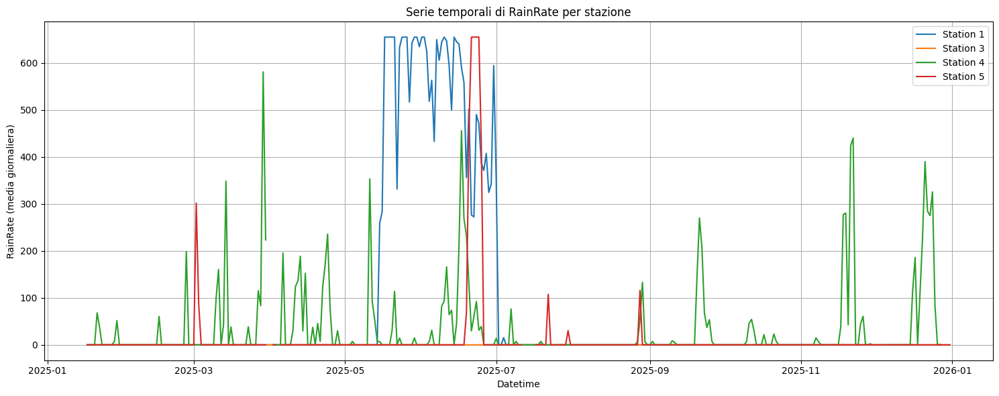

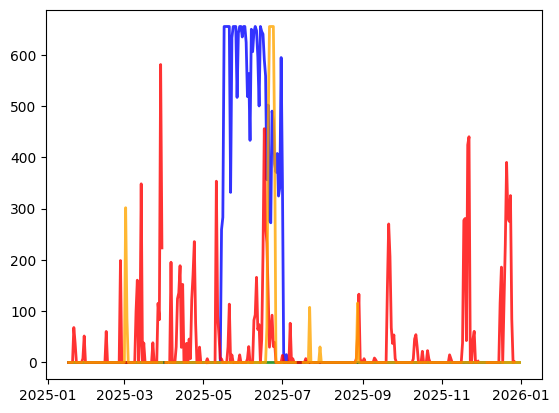

In [73]:
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 6))

for station_id, df in datasets.items():
    if "RainRate" not in df.columns:
        continue
    # Resample giornaliero (media)
    daily = df.set_index('Datetime')['RainRate'].resample('D').mean()
    plt.plot(daily.index, daily.values, label=f'Station {station_id}')

plt.xlabel("Datetime")
plt.ylabel("RainRate (media giornaliera)")
plt.title("Serie temporali di RainRate per stazione")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()
colors = ['blue', 'green', 'red', 'orange']
for i, (station_id, df) in enumerate(datasets.items()):
    if "RainRate" not in df.columns:
        continue
    daily = df.set_index('Datetime')['RainRate'].resample('D').mean()
    plt.plot(daily.index, daily.values, label=f'Station {station_id}', 
             color=colors[i % len(colors)], alpha=0.8, linewidth=2)


In [74]:
threshold = 0.1         # soglia di rainrate
threshold_range = pd.Timedelta('30min')  # massimo intervallo senza pioggia tra due piogge dello stesso evento

In [77]:
# def extract_events(df, threshold=0.1, threshold_range=pd.Timedelta('30min')):
#     df = df.sort_values('Datetime').reset_index(drop=True)
    
#     events = []  # lista di eventi
#     event_start = None
#     event_end = None
    
#     for i, row in df.iterrows():
#         rain = row['RainRate']
#         time = row['Datetime']
        
#         if rain > threshold:
#             if event_start is None:
#                 # inizio nuovo evento
#                 event_start = time
#                 event_end = time
#             else:
#                 # continuo evento esistente
#                 event_end = time
#         else:
#             if event_start is not None:
#                 # siamo sotto soglia, guardiamo se è un piccolo intervallo
#                 if i + 1 < len(df):
#                     next_time = df.loc[i+1, 'Datetime']
#                     gap = next_time - time
#                     if gap <= threshold_range:
#                         # continua evento
#                         event_end = next_time
#                     else:
#                         # fine evento
#                         events.append({'start': event_start, 'end': event_end})
#                         event_start = None
#                         event_end = None

#     # aggiungi l'ultimo evento se ancora aperto
#     if event_start is not None:
#         events.append({'start': event_start, 'end': event_end})
    
#     # costruisco il nuovo dataset con solo gli eventi
#     event_dfs = []
#     for ev in events:
#         mask = (df['Datetime'] >= ev['start']) & (df['Datetime'] <= ev['end'])
#         event_dfs.append(df.loc[mask])
    
#     if event_dfs:
#         return pd.concat(event_dfs).reset_index(drop=True)
#     else:
#         return pd.DataFrame(columns=df.columns)
# def extract_events(df, threshold=0.1, threshold_range=pd.Timedelta('30min')):
#     df = df.sort_values('Datetime').reset_index(drop=True)

#     events = []
#     current_event = []

#     for _, row in df.iterrows():
#         rain = row['RainRate']

#         if rain > threshold:
#             # inizio o continuo evento
#             current_event.append(row)
#         else:
#             # se siamo in evento e è finito
#             if current_event:
#                 events.append(pd.DataFrame(current_event))
#                 current_event = []

#     # chiudi evento finale
#     if current_event:
#         events.append(pd.DataFrame(current_event))

#     # concatena tutti gli eventi in unico dataset
#     if events:
#         event_df = pd.concat(events, ignore_index=True)
#     else:
#         event_df = pd.DataFrame(columns=df.columns)

#     return event_df, events  # ritorno sia dataset totale che lista dei singoli eventi
def extract_events(df, threshold=0.1, threshold_range=pd.Timedelta('30min')):
    df = df.sort_values('Datetime').reset_index(drop=True)

    events = []
    current_event = []
    last_above_time = None
    event_open = False

    for _, row in df.iterrows():
        rain = row['RainRate']
        time = row['Datetime']

        if rain > threshold:
            # Siamo sopra soglia -> sicuramente dentro evento
            current_event.append(row)
            last_above_time = time
            event_open = True

        else:
            # Siamo sotto soglia
            if event_open:
                # Verifica se siamo ancora entro il threshold_range
                if last_above_time is not None and (time - last_above_time) <= threshold_range:
                    # siamo ancora dentro evento -> appendiamo comunque
                    current_event.append(row)
                else:
                    # finestra scaduta -> evento concluso
                    events.append(pd.DataFrame(current_event))
                    current_event = []
                    event_open = False
            # se non c'è evento aperto, ignoriamo

    # chiusura evento finale se aperto
    if event_open and current_event:
        events.append(pd.DataFrame(current_event))

    # costruiamo dataframe totale (tutti eventi concatenati)
    if events:
        event_df = pd.concat(events, ignore_index=True)
    else:
        event_df = pd.DataFrame(columns=df.columns)

    return event_df, events


In [80]:
(event_ws3, events_list) = extract_events(datasets[3], threshold, threshold_range)

In [81]:
# Numero di righe totali
print("Righe in datasets[3]:", datasets[3].shape[0])
print("Righe in event_ws3:", event_ws3.shape[0])
print("deleted:", datasets[3].shape[0]- event_ws3.shape[0])

Righe in datasets[3]: 2775126
Righe in event_ws3: 58694
deleted: 2716432


In [82]:
# Per datasets[3] e event_ws3
zero_rain_dataset = (datasets[3]['RainRate'] == 0).sum()
zero_rain_event = (event_ws3['RainRate'] == 0).sum()

print(f"Numero righe con RainRate = 0 in datasets[3]: {zero_rain_dataset}")
print(f"Numero righe con RainRate = 0 in event_ws3: {zero_rain_event}")

Numero righe con RainRate = 0 in datasets[3]: 2728893
Numero righe con RainRate = 0 in event_ws3: 18748


In [83]:
event_ws3

,Barometer,TempIn,HumIn,TempOut,WindSpeed,HumOut,RainRate,Datetime,station_id
0,30.062,60.0,54.0,53.7,6.0,73.0,0.14,2025-01-18 19:06:36+00:00,3
1,30.062,60.0,54.0,53.6,2.0,74.0,0.14,2025-01-18 19:06:47+00:00,3
2,30.062,60.0,54.0,53.5,6.0,74.0,0.14,2025-01-18 19:06:58+00:00,3
3,30.062,60.0,54.0,53.5,2.0,74.0,0.14,2025-01-18 19:07:09+00:00,3
4,30.062,60.0,54.0,53.5,9.0,74.0,0.14,2025-01-18 19:07:20+00:00,3
...,...,...,...,...,...,...,...,...,...
58689,30.141,61.1,46.0,47.3,1.0,73.0,0.00,2025-12-27 23:29:13+00:00,3
58690,30.140,61.1,46.0,47.4,1.0,73.0,0.00,2025-12-27 23:29:23+00:00,3
58691,30.140,61.1,46.0,47.4,1.0,73.0,0.00,2025-12-27 23:29:34+00:00,3
58692,30.140,61.1,46.0,47.3,2.0,73.0,0.00,2025-12-27 23:29:44+00:00,3


In [84]:
event_ws3.to_csv("event_ws3.csv", index=False)

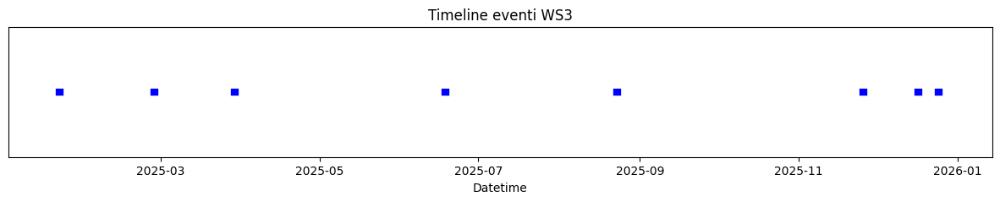

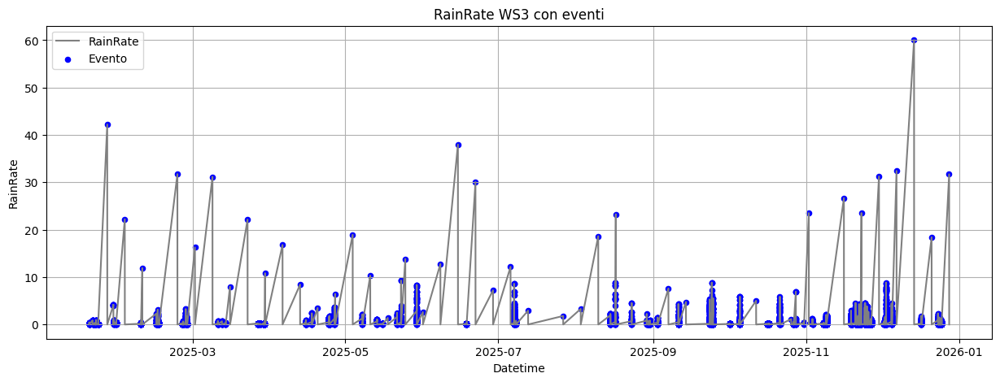

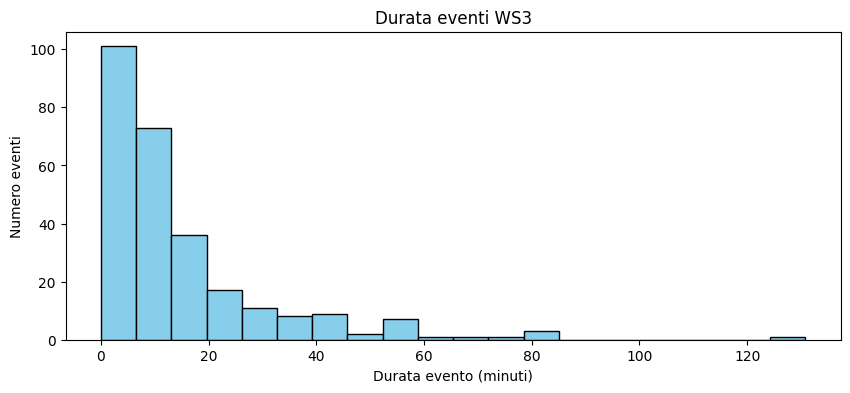

In [85]:
# Timeline degli eventi come barre
def plot_events_timeline(df, title="Eventi di pioggia"):
    events = []
    current_event = None
    for i, row in df.iterrows():
        if row['RainRate'] > threshold:
            if current_event is None:
                current_event = {'start': row['Datetime'], 'end': row['Datetime']}
            else:
                current_event['end'] = row['Datetime']
        else:
            if current_event is not None:
                events.append(current_event)
                current_event = None
    if current_event:
        events.append(current_event)

    plt.figure(figsize=(15, 2))
    for ev in events:
        plt.plot([ev['start'], ev['end']], [1, 1], color='blue', linewidth=6)
    plt.title(title)
    plt.yticks([])
    plt.xlabel("Datetime")
    plt.show()

# Serie temporale con eventi evidenziati
def plot_rainrate_with_events(df, title="RainRate con eventi"):
    plt.figure(figsize=(15,5))
    plt.plot(df['Datetime'], df['RainRate'], label='RainRate', color='grey')
    
    # evidenzio gli eventi
    event_mask = df['RainRate'] > threshold
    plt.scatter(df.loc[event_mask, 'Datetime'], df.loc[event_mask, 'RainRate'], 
                color='blue', label='Evento', s=20)
    
    plt.xlabel("Datetime")
    plt.ylabel("RainRate")
    plt.title(title)
    plt.legend()
    plt.grid(True)
    plt.show()

# Istogramma delle durate degli eventi
def plot_event_durations(df, title="Durata eventi"):
    events = []
    current_event = None
    for i, row in df.iterrows():
        if row['RainRate'] > threshold:
            if current_event is None:
                current_event = {'start': row['Datetime'], 'end': row['Datetime']}
            else:
                current_event['end'] = row['Datetime']
        else:
            if current_event is not None:
                events.append(current_event)
                current_event = None
    if current_event:
        events.append(current_event)
    
    durations = [(ev['end'] - ev['start']).total_seconds()/60 for ev in events]  # durata in minuti
    
    plt.figure(figsize=(10,4))
    plt.hist(durations, bins=20, color='skyblue', edgecolor='black')
    plt.xlabel("Durata evento (minuti)")
    plt.ylabel("Numero eventi")
    plt.title(title)
    plt.show()


# --- Esempio per la stazione 3 ---
plot_events_timeline(event_ws3, title="Timeline eventi WS3")
plot_rainrate_with_events(event_ws3, title="RainRate WS3 con eventi")
plot_event_durations(event_ws3, title="Durata eventi WS3")

In [86]:
total_nans = event_ws3.isna().sum().sum()
print(f"Totale NaN: {total_nans}")

# Numero di NaN per colonna
nans_per_col = event_ws3.isna().sum()
print("NaN per colonna:")
print(nans_per_col)

Totale NaN: 833
NaN per colonna:
Barometer     119
TempIn        119
HumIn         119
TempOut       119
WindSpeed     119
HumOut        119
RainRate      119
Datetime        0
station_id      0
dtype: int64


/var/folders/h_/57x0p6rs0z7crnpsbzlw5nd40000gn/T/ipykernel_6520/197004064.py:6: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  df['Month'] = df['Datetime'].dt.to_period('M')


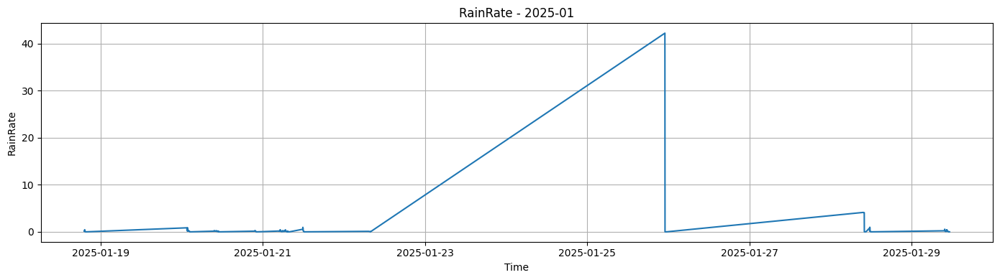

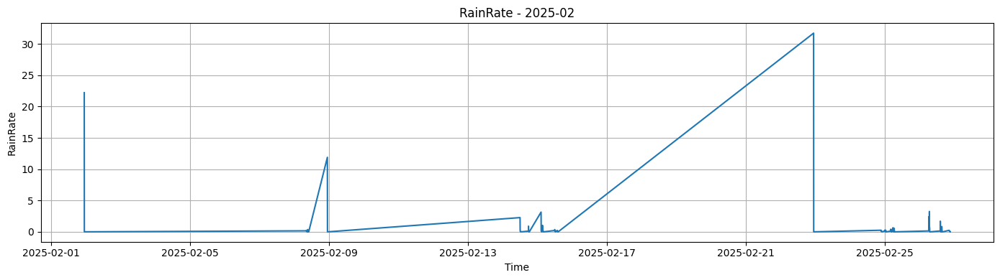

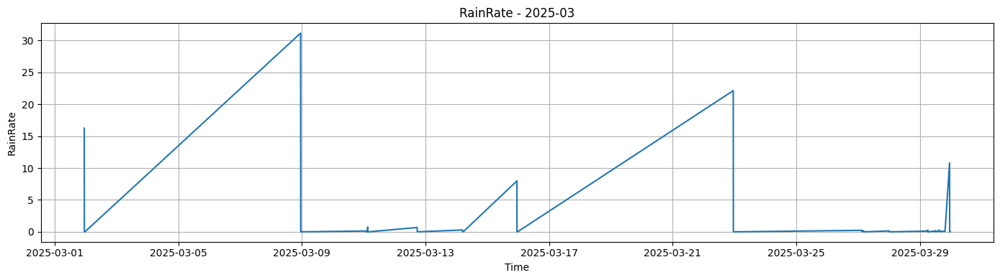

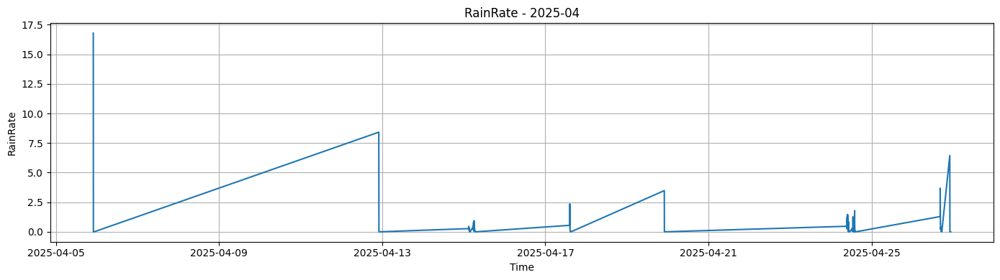

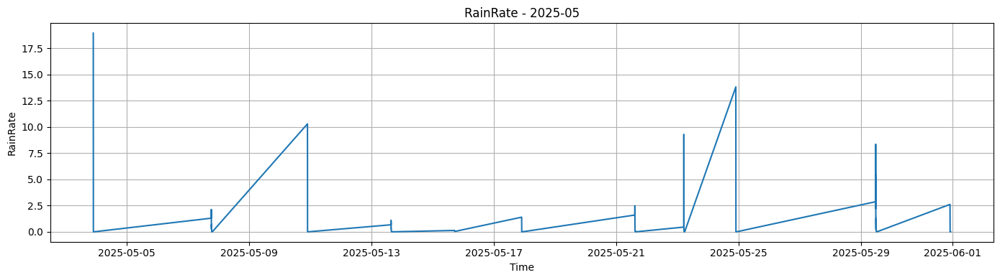

...

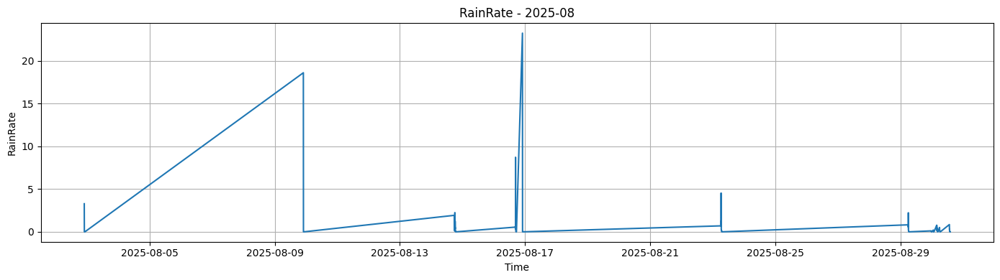

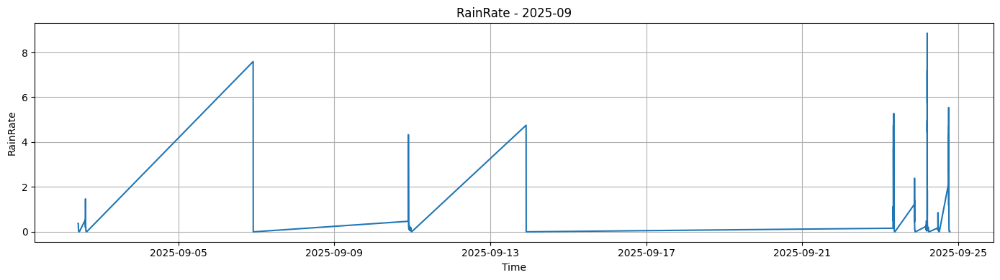

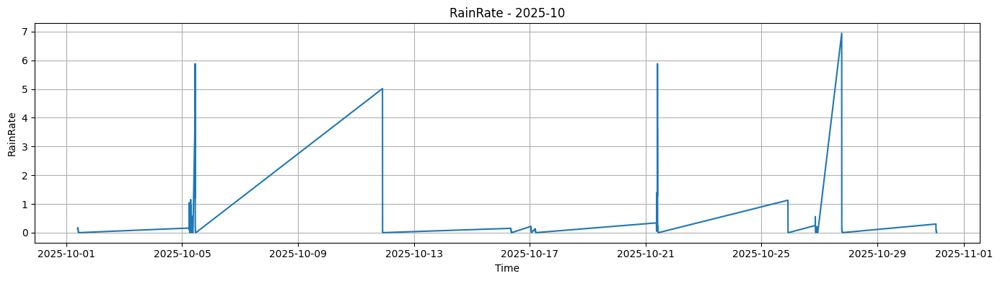

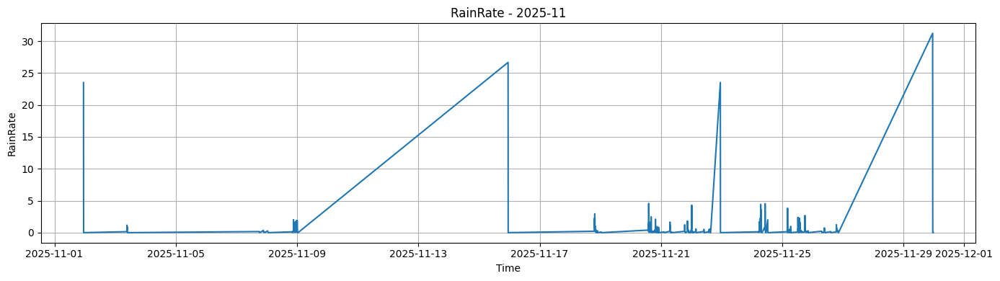

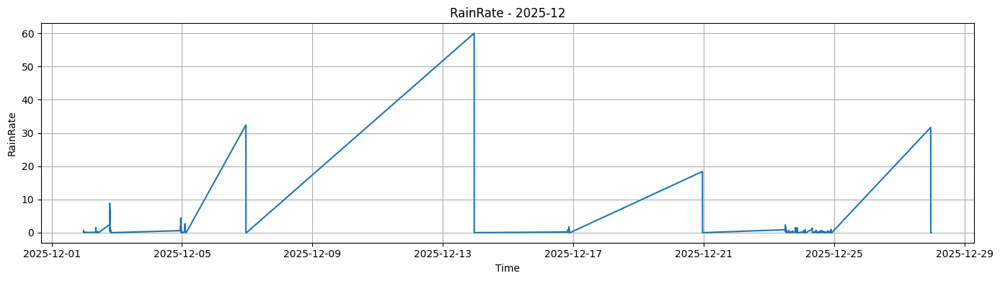

In [87]:
import matplotlib.pyplot as plt

df = event_ws3.copy()
df = df.sort_values('Datetime')

df['Month'] = df['Datetime'].dt.to_period('M')

for month, chunk in df.groupby('Month'):
    plt.figure(figsize=(14,4))
    plt.plot(chunk['Datetime'], chunk['RainRate'])
    plt.title(f"RainRate - {month}")
    plt.xlabel("Time")
    plt.ylabel("RainRate")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

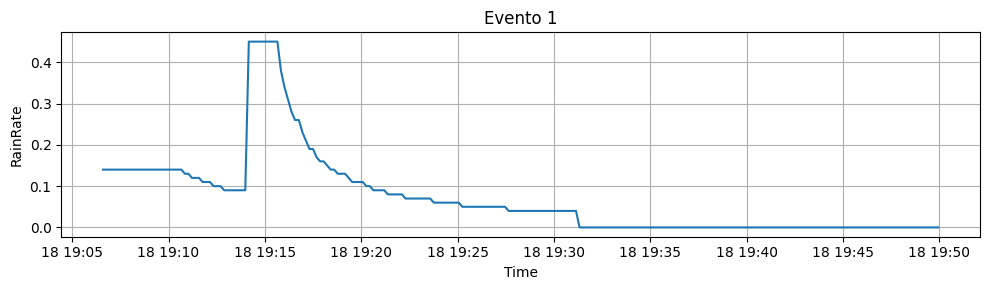

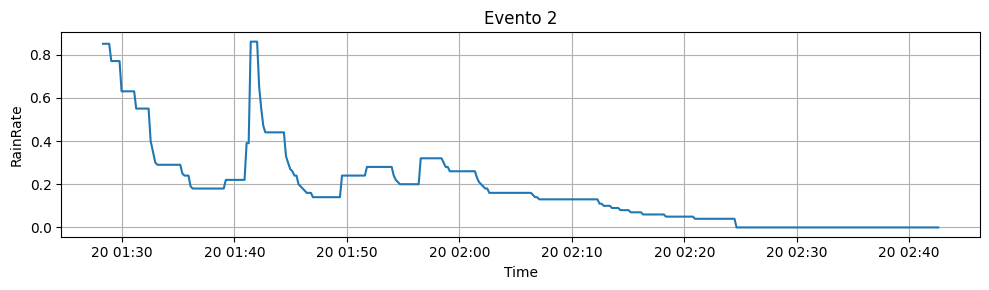

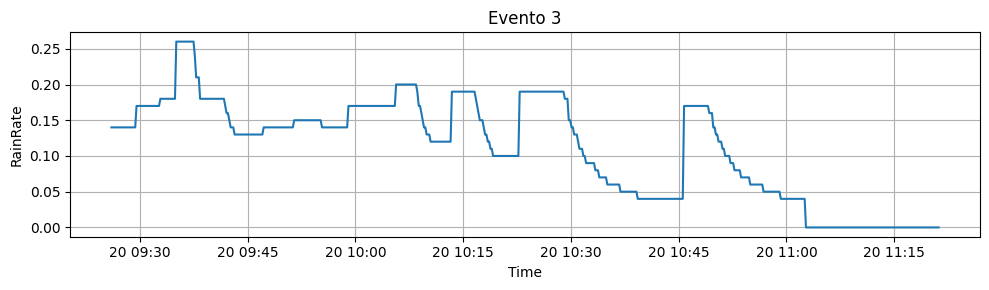

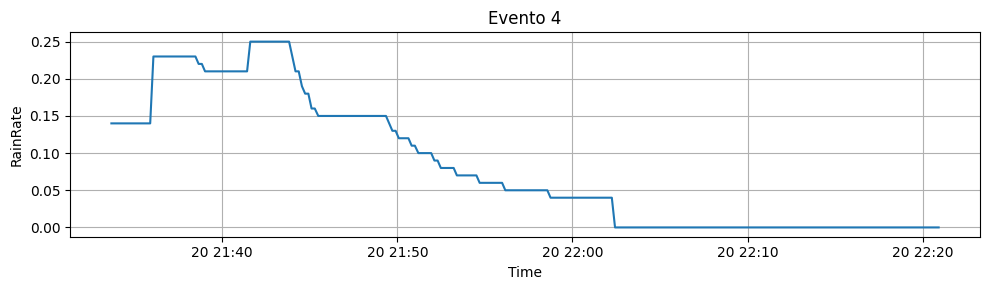

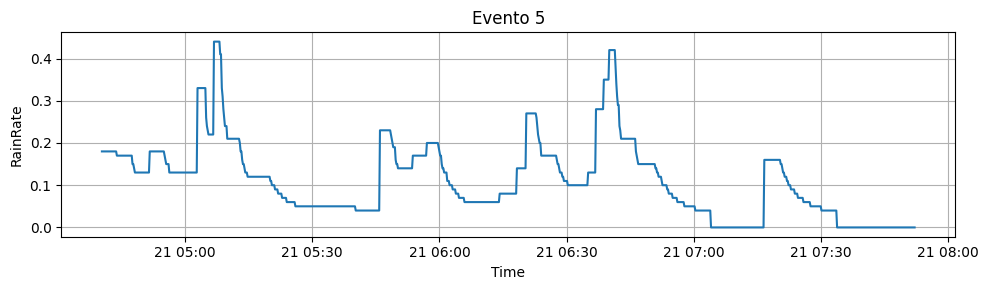

...

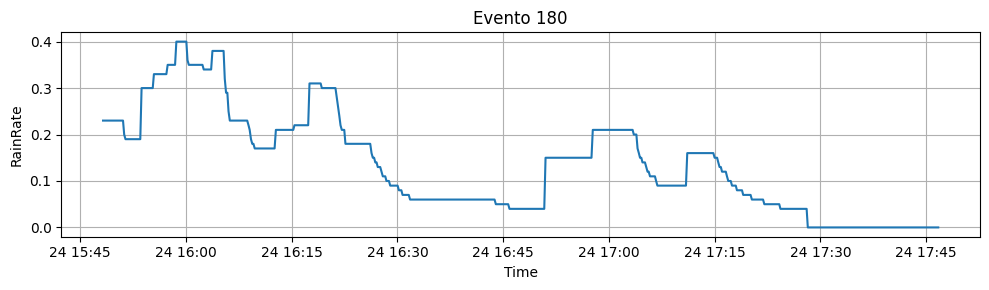

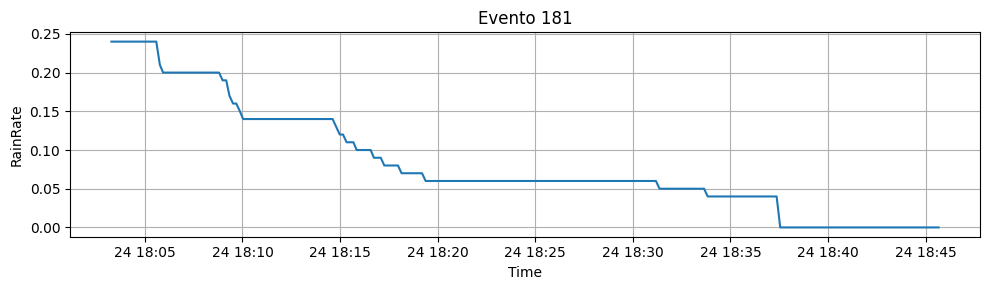

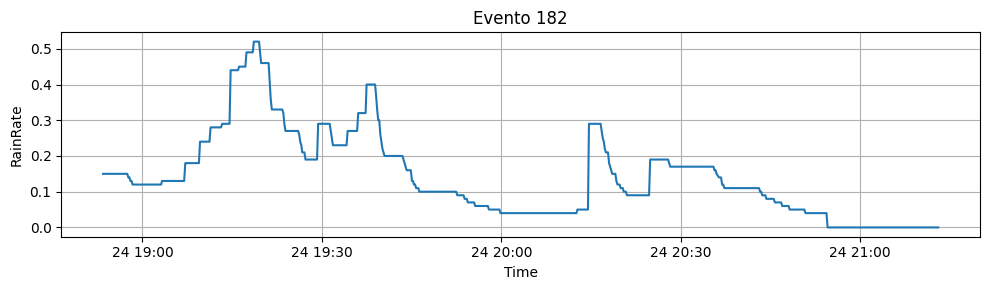

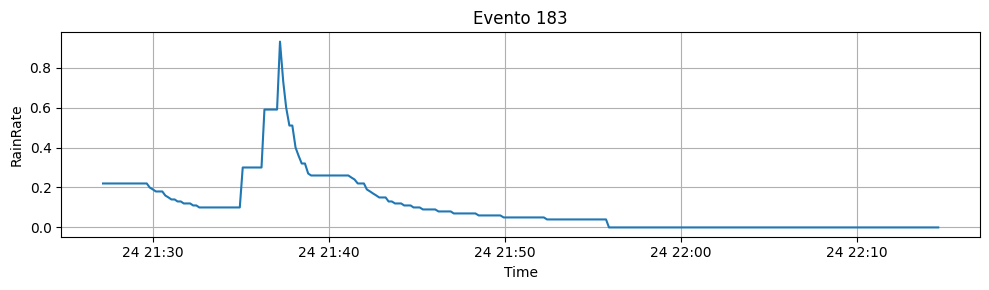

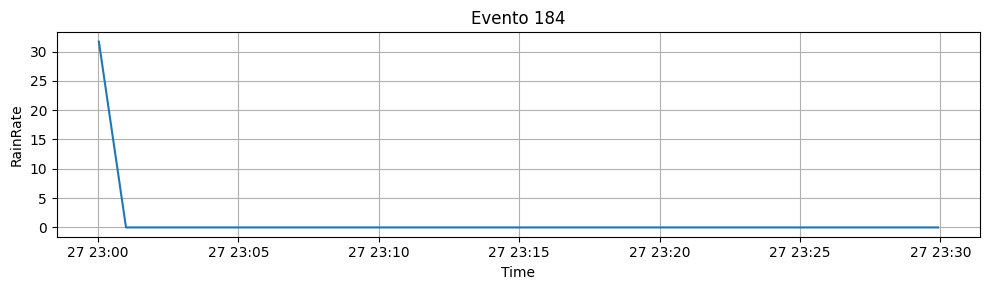

In [89]:
for i, ev in enumerate(events_list):
    plt.figure(figsize=(10,3))
    plt.plot(ev['Datetime'], ev['RainRate'])
    plt.title(f"Evento {i+1}")
    plt.xlabel("Time")
    plt.ylabel("RainRate")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

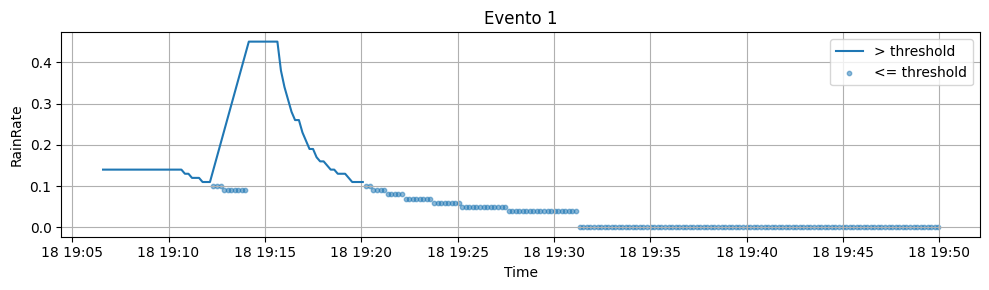

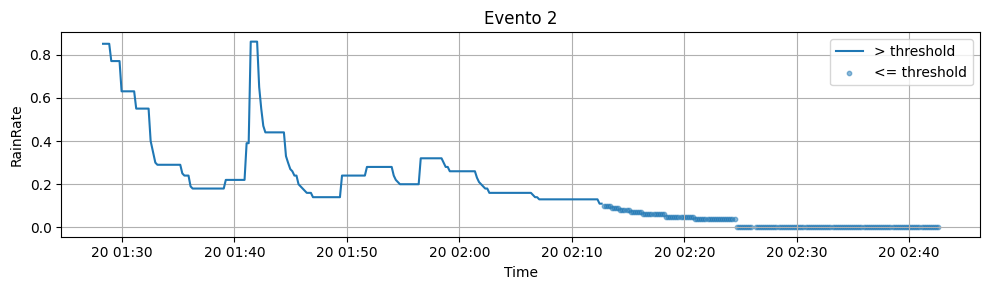

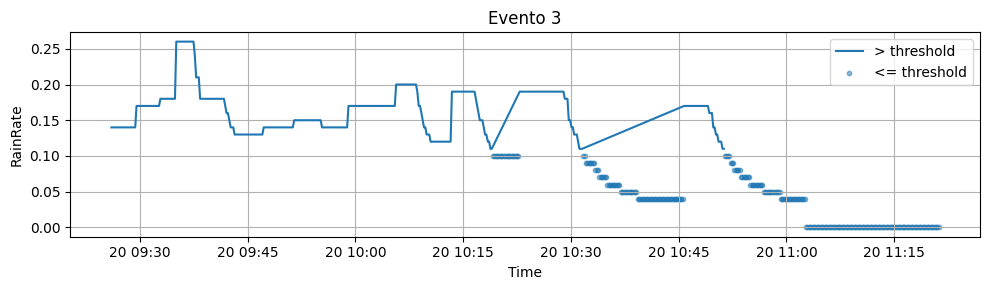

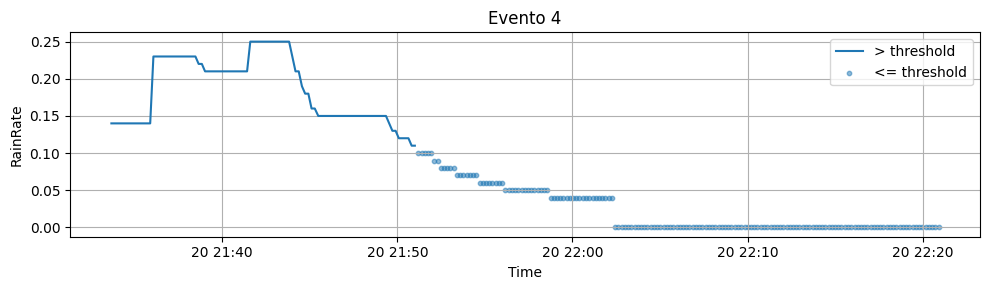

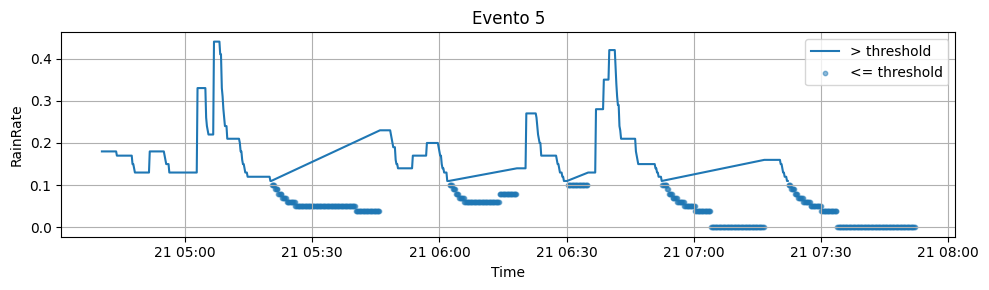

...

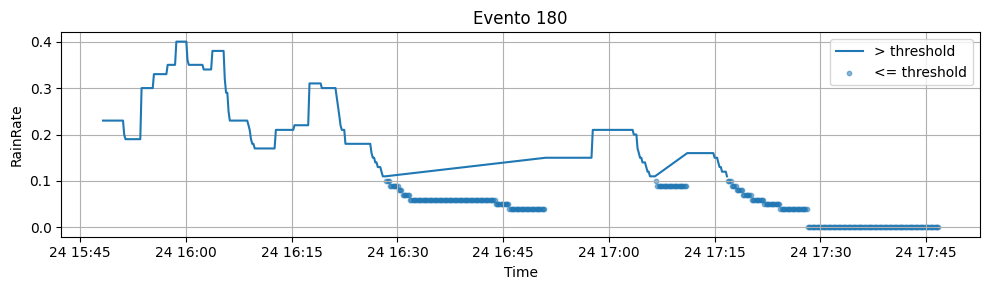

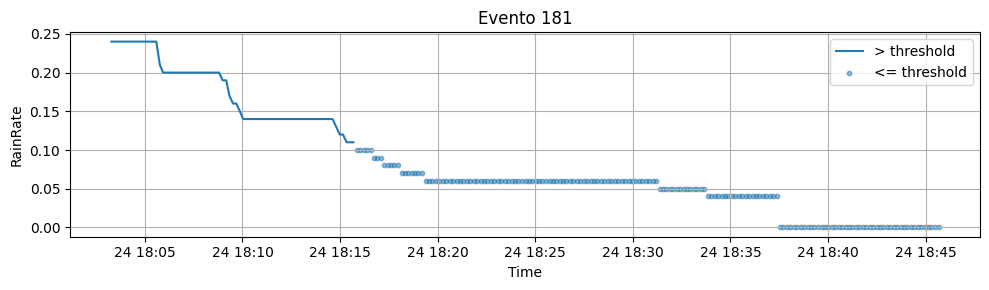

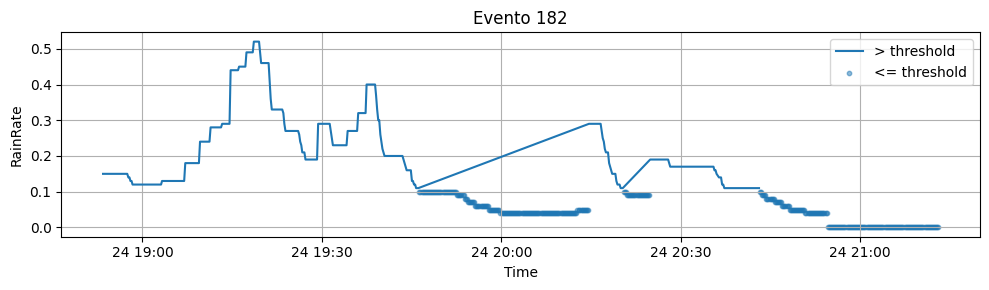

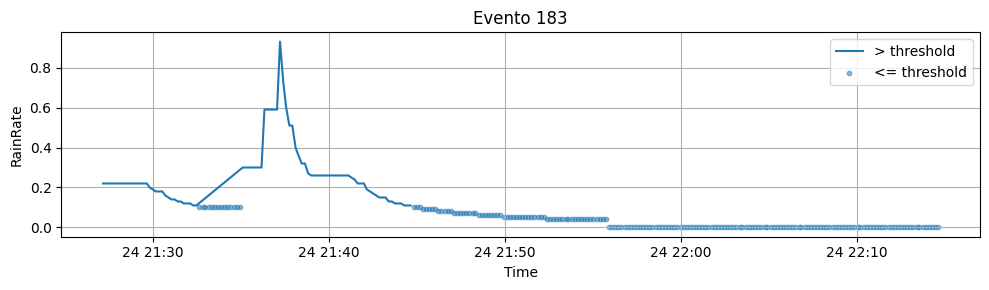

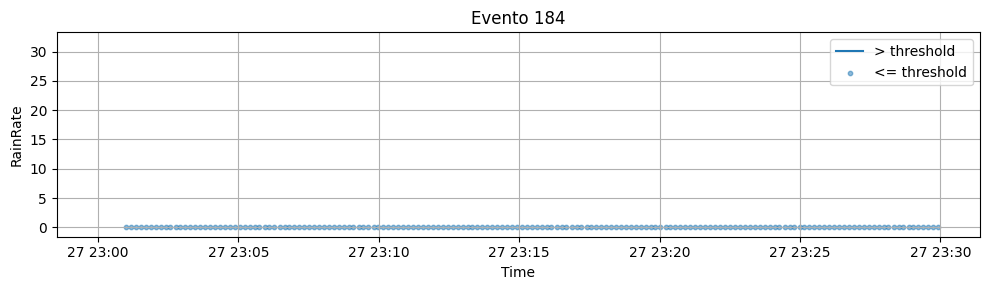

In [90]:
for i, ev in enumerate(events_list):
    plt.figure(figsize=(10,3))

    above = ev[ev['RainRate'] > threshold]
    below = ev[ev['RainRate'] <= threshold]

    plt.plot(above['Datetime'], above['RainRate'], label='> threshold')
    plt.scatter(below['Datetime'], below['RainRate'], s=10, alpha=0.5, label='<= threshold')

    plt.title(f"Evento {i+1}")
    plt.xlabel("Time")
    plt.ylabel("RainRate")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

In [91]:
n_over = (event_ws3['RainRate'] > threshold).sum()
n_under = (event_ws3['RainRate'] <= threshold).sum()

print("Valori > threshold:", n_over)
print("Valori <= threshold:", n_under)
print("Totale:", n_over + n_under)

Valori > threshold: 23053
Valori <= threshold: 35522
Totale: 58575


In [92]:
tot = len(event_ws3)

print("Percentuale > threshold:", n_over / tot * 100, "%")
print("Percentuale <= threshold:", n_under / tot * 100, "%")

Percentuale > threshold: 39.27658704467237 %
Percentuale <= threshold: 60.52066650764984 %


In [93]:
for i, ev in enumerate(events_list):
    n_over = (ev['RainRate'] > threshold).sum()
    n_under = (ev['RainRate'] <= threshold).sum()
    print(f"Evento {i+1}: >t = {n_over}, <=t = {n_under}, tot = {len(ev)}")

Evento 1: >t = 64, <=t = 172, tot = 236
Evento 2: >t = 240, <=t = 161, tot = 401
Evento 3: >t = 367, <=t = 258, tot = 625
Evento 4: >t = 95, <=t = 162, tot = 257
Evento 5: >t = 496, <=t = 542, tot = 1038
Evento 6: >t = 73, <=t = 161, tot = 234
Evento 7: >t = 31, <=t = 161, tot = 192
Evento 8: >t = 1, <=t = 158, tot = 159
Evento 9: >t = 10, <=t = 160, tot = 289
Evento 10: >t = 69, <=t = 162, tot = 231
Evento 11: >t = 237, <=t = 268, tot = 505
Evento 12: >t = 1, <=t = 157, tot = 158
Evento 13: >t = 102, <=t = 162, tot = 264
Evento 14: >t = 82, <=t = 162, tot = 244
Evento 15: >t = 1, <=t = 158, tot = 159
Evento 16: >t = 41, <=t = 163, tot = 204
Evento 17: >t = 34, <=t = 162, tot = 196
Evento 18: >t = 43, <=t = 161, tot = 204
Evento 19: >t = 140, <=t = 162, tot = 302
Evento 20: >t = 111, <=t = 162, tot = 273
Evento 21: >t = 90, <=t = 162, tot = 252
Evento 22: >t = 1, <=t = 158, tot = 159
Evento 23: >t = 78, <=t = 161, tot = 239
Evento 24: >t = 120, <=t = 298, tot = 418
Evento 25: >t = 92, 

In [95]:
zero_count = (event_ws3['RainRate'] == 0).sum()
print("Numero di righe con RainRate = 0 in event_ws3:", zero_count)

Numero di righe con RainRate = 0 in event_ws3: 18748


In [ ]:
# def load_weather_data(base_path="storage/vantage-pro/2025", downsample_factor=60, station_id=None):
#     month_folders = sorted(glob.glob(os.path.join(base_path, "*")))
#     all_dfs = []

#     for month_folder in month_folders:
#         csv_files = sorted(glob.glob(os.path.join(month_folder, "*.csv")))
#         if not csv_files: continue
#         for csv_file in csv_files:
#             all_dfs.append(pd.read_csv(csv_file))

#     if not all_dfs:
#         raise ValueError("Nessun CSV trovato!")

#     df = pd.concat(all_dfs, ignore_index=True)
#     df['Datetime'] = pd.to_datetime(df['Datetime'])
#     if station_id is not None:
#         df["station_id"] = station_id
        
#     df = df.sort_values('Datetime').reset_index(drop=True)
###################################################################
    # # 1. Pulizia e Log-Transform
    # df['RainRate'] = df['RainRate'].clip(lower=0.0)
    # # Applichiamo una soglia di rumore (es. 0.1 mm/h)
    # df['RainRate'] = df['RainRate'].apply(lambda x: 0.0 if x < 0.1 else x)
    # # Log-transform: schiaccia i valori alti e riduce la varianza della Loss
    # df['RainRate'] = np.log1p(df['RainRate'])

    # # 2. Bilanciamento Classi (Sottocampionamento degli zeri)
    # df_zero = df[df['RainRate'] == 0].sample(frac=0.33, random_state=42)
    # df_rain = df[df['RainRate'] > 0]
    
    # # Uniamo e riordiniamo per tempo (fondamentale per i Transformer)
    # df_balanced = pd.concat([df_zero, df_rain]).sort_values('Datetime')

    # # 3. Downsampling 
    # # Usiamo il dataframe bilanciato e non solo df_rain!
    # return df_balanced.iloc[::downsample_factor].reset_index(drop=True)